# DeepShadows: Separating LSB galaxies from Artifacts using Deep Learning

This is the main notebook where we use the *DeepShadows* CNN architecture to classify LSBGs/Artifacts. 

We also use SVMs and RFs (with features derived from `SourceExtractor`) to perform the same classification, in order to be able to compare the results with those from the CNN. 


### Import Packages

In [1]:
# Import basic packages
import numpy as np
import scipy as sp
import pandas as pd
from scipy import interpolate
import random

# Colab in order to download files
from google.colab import files

# =========================================
# =========================================
# scikit-learn for Machine Learn

# Preprocessing
from sklearn.preprocessing import StandardScaler #Standar scaler for standardization
from sklearn.manifold import TSNE # Dimensionality reduction technique
from sklearn.model_selection import GridSearchCV #Cross-Validation
from sklearn.utils import resample #Resampling
# Classifiers
from sklearn.svm import SVC #Support Vector Classifier
from sklearn.ensemble import RandomForestClassifier as RF #Random Forests
# Metrics
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

# =======================================
# =======================================
# Tensorflow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import regularizers
from tensorflow.keras import optimizers
# Keras Layers
from keras.layers import InputLayer
from keras.layers import Conv2D
from keras.layers import BatchNormalization
from keras.layers import Dropout
from keras.layers import MaxPool2D
from keras.layers import Flatten
from keras.layers import Dense

# ==============================================
# ==============================================
# Matplotlib, seaborn and plot pretty 
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
%matplotlib inline
from matplotlib import rcParams
rcParams['font.family'] = 'serif'

# Adjust rc parameters to make plots pretty
def plot_pretty(dpi=200, fontsize=9):
    

    plt.rc("savefig", dpi=dpi)       # dpi resolution of saved image files
    plt.rc('text', usetex=False)      # use LaTeX to process labels
    plt.rc('font', size=fontsize)    # fontsize
    plt.rc('xtick', direction='in')  # make axes ticks point inward
    plt.rc('ytick', direction='in')
    plt.rc('xtick.major', pad=10) 
    plt.rc('xtick.minor', pad=5)
    plt.rc('ytick.major', pad=10) 
    plt.rc('ytick.minor', pad=5)
    plt.rc('lines', dotted_pattern = [0.5, 1.1]) # fix dotted lines

    return

plot_pretty()

# Pillow
from PIL import Image

### Import datasets

- `X_tr, X_val, X_test`: Refer to the training, validation and test sets for the image-based classification (deep learning). 

- `X_feat_tr, X_feat_val, X_feat_test`: Refer to the training, validation and test sets for the feature-based classification (Machine Learning - SVM and Random Forests).

- `y_tr, y_val, y_test`: Labels - training, validation and test sets.

In [2]:
# Mount drive to upload the datasets
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# For image-based classification
X_tr = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/X_train.npy")) #Training
X_val = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/X_val.npy")) #Validation
X_test = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/X_test.npy")) #Test

# For feature-based classification
X_feat_tr = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/X_feat_train.npy")) #Training
X_feat_val = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/X_feat_val.npy")) #Validation
X_feat_test = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/X_feat_test.npy")) #Test

# Labels
y_tr = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/y_train.npy")) # Training
y_val = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/y_val.npy")) #Validation
y_test = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/y_test.npy")) #Test

### Plot examples of LSBGs and Artifacts

Now let's make a plot of a random sample of 20 LSBGs and 20 artefacts from the training set.

In [4]:
X_pos = X_tr[y_tr==1.] #Positives - LSBGs
X_neg = X_tr[y_tr==0.] #Negatives - Artifacts
# Get some random indices
randind = np.random.randint(0,15000,20)
print(randind)
randind  = [9221,10239,1601,1590,9178,1388,4419,3591,11241,12395,3422,441,
            11547,7808,11841,12008,5189,1081,6403,6299]

X_sample_LSBG = X_pos[randind]
X_sample_Artefacts = X_neg[randind]

[    0  5373  6830  5226  8964  4973  9842  8284  3417     0  7703  9349
  3162  2110  8813  5909  1166  9179  5361 14770]


- Plot examples of LSBGs

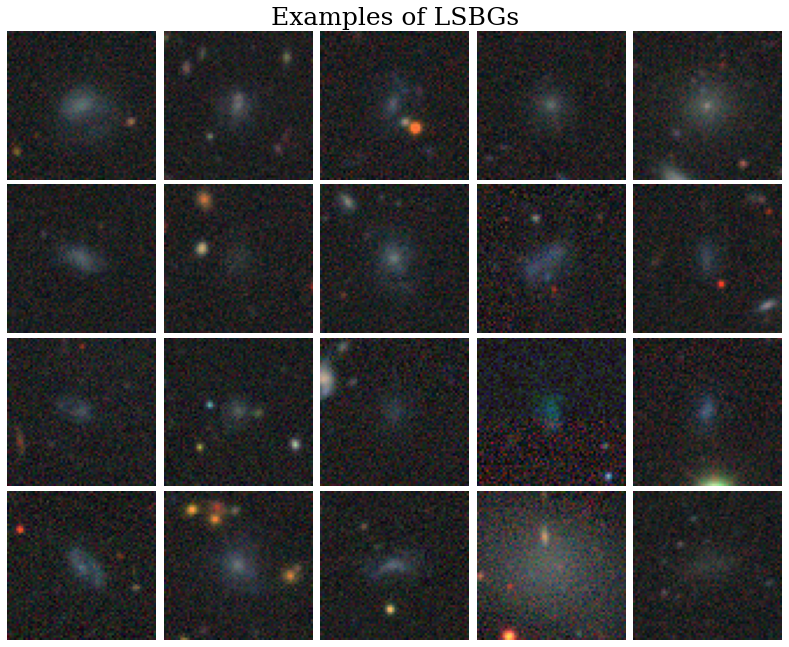

In [5]:
# Plot them
n_rows = 4
n_cols = 5

plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

for i in range(n_rows*n_cols):
    if (i==3):
        plt.title("Examples of LSBGs",fontsize=25)
    plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(X_sample_LSBG[i])
    plt.axis('off')


plt.subplots_adjust(wspace=0.01, hspace=0.03)
#plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/LSBG_Examples.pdf")
#files.download("/content/drive/My Drive/Plots/LSBG_Examples.pdf")
plt.show()


- Plot examples of artefacts

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

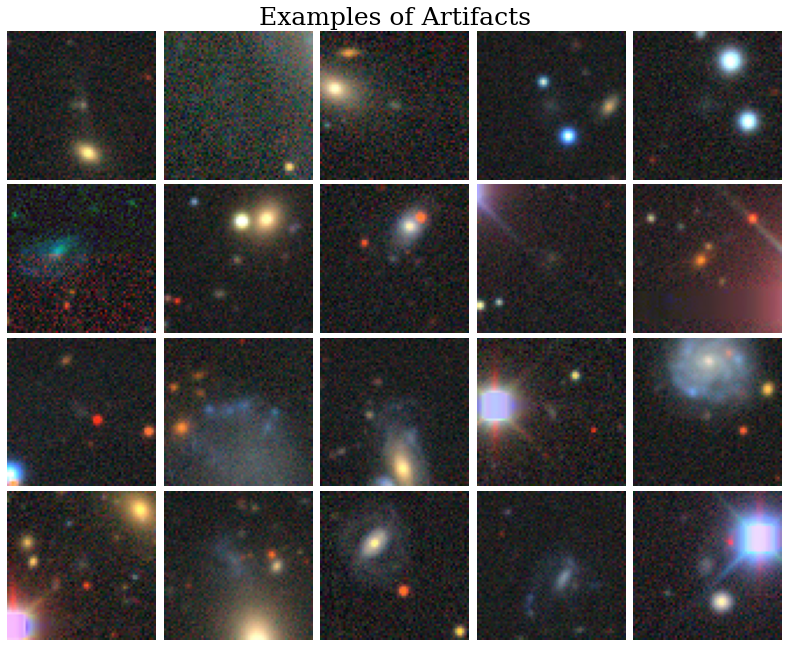

In [6]:
plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

for i in range(n_rows*n_cols):
    if (i==3):
        plt.title("Examples of Artifacts",fontsize=25)
    plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(X_sample_Artefacts[i])
    plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.03)
#plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Artifacts_Examples.pdf")
#files.download("/content/drive/My Drive/Plots/Artifacts_Examples.pdf")
plt.show()


## Part I: Feature-Based, Machine Learning Classification


In the first part we use the SExtractor parameters (magnitudes, colors, flux radii, surf. brightness) as features 

In [7]:
# Standardize the training, validation and test sets
scaler = StandardScaler()
scaler.fit(X_feat_tr)
X_feat_tr_stand = scaler.transform(X_feat_tr)
X_feat_val_stand = scaler.transform(X_feat_val)
X_feat_test_stand = scaler.transform(X_feat_test)

### Exploratory data analysis: t-SNE visualization

In [8]:
X_tsne_2 = TSNE(n_components=2).fit_transform(X_feat_tr_stand)

Make a plot now

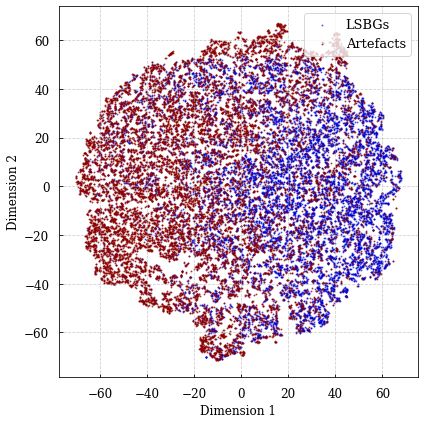

In [9]:
ft_1 = X_tsne_2[:,0]
ft_2 = X_tsne_2[:,1]


plt.figure(figsize = (6.0,6.0))

plt.scatter(ft_1[y_tr==1],ft_2[y_tr==1],rasterized=True,marker='o',s=1.0, color='mediumblue',alpha=0.5, label='LSBGs')
plt.scatter(ft_1[y_tr==0],ft_2[y_tr==0],rasterized=True, s=1.0, color='darkred',alpha=0.6, label='Artefacts')

plt.grid(ls='--', alpha=0.6)
plt.xlabel('Dimension 1',fontsize=12);plt.ylabel('Dimension 2', fontsize=12)
#plt.title('2D t-SNE visualization of the sample', fontsize=11)
plt.tick_params(axis='both', labelsize=12)
plt.legend(frameon=True, loc='upper right', fontsize=13)

plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/t_SNE.pdf")
#files.download("/content/drive/My Drive/Plots/t_SNE.pdf")
plt.show()

### Support Vector Machines Classifier (SVMs)

In the first part we use a Support Vector Classifier, we tune the hyperparameters by 5-fold Cross Validation on the validation set.

In [10]:
svm_1 = SVC(kernel='rbf') # Initialize Support Vector Machine

# Define Grid of Parameters
#param_grid = {'C': [100,1e3,1e4,1e5],
#              'gamma': [0.001, 0.01,0.1]}
#grid = GridSearchCV(svm_1, param_grid)
#%time grid.fit(X_feat_val_stand, y_val)
#print(grid.best_params_)

In [11]:
C_par = 10000 #The best parameter C, from the grid search above
gamma_par = 0.01 #The best parameter gamma, from the grid search above

# Define model
svm_c = SVC(C=10000,kernel='rbf',gamma=0.001,probability=True)
# Fit
svm_c.fit(X_feat_tr_stand,y_tr)

# Predict on the test set
y_pred_svm = svm_c.predict(X_feat_test_stand)

Print classification metrics

In [12]:
print("Accuracy score for SVM:",accuracy_score(y_test,y_pred_svm))
print("Precision score for SVM",precision_score(y_test,y_pred_svm))
print("Recall score for SVM",recall_score(y_test,y_pred_svm))
#print("AUC score for SVM",roc_auc_score(y_test,y_pred_svm))#This was not correct, requires scores, predict later

Accuracy score for SVM: 0.8196
Precision score for SVM 0.7965367965367965
Recall score for SVM 0.8672427336999214


### Random Forests

In [13]:
RF_1 = RF(n_estimators=100, criterion='gini', max_depth=None,
          min_samples_split=2, min_samples_leaf=1)

# Search in a grid

param_grid = {'n_estimators': [10, 100, 150],
              'min_samples_split': [5,10,50]}

grid_RF = GridSearchCV(RF_1, param_grid)

%time grid_RF.fit(X_feat_val_stand, y_val)
print(grid_RF.best_params_)

CPU times: user 57.2 s, sys: 48.1 ms, total: 57.3 s
Wall time: 57.3 s
{'min_samples_split': 50, 'n_estimators': 150}


In [14]:
# Redefine the classifier
RF_cl = RF(n_estimators=100, criterion='gini', max_depth=None,
                               min_samples_split=10, min_samples_leaf=1)
# fit 
RF_cl.fit(X_feat_tr_stand,y_tr)

# predict now on the test set
y_pred_RF = RF_cl.predict(X_feat_test_stand)

Print classification metrics

In [16]:
print("Accuracy score for RF:",accuracy_score(y_test,y_pred_RF))
print("Precision score for RF",precision_score(y_test,y_pred_RF))
print("Recall score for RF",recall_score(y_test,y_pred_RF))
#print("AUC score for RF",roc_auc_score(y_test,y_pred_RF))

Accuracy score for RF: 0.7972
Precision score for RF 0.7966692486444616
Recall score for RF 0.8079340141398271


## Part II: Deep Learning - the DeepShadows architecture

Here we use the DeepShadows architecture to classify galaxies, using directly the astronomical images data.

In [17]:
# build the  original model
model = keras.models.Sequential()
model.add(InputLayer((64,64,3)))
model.add(Conv2D(filters=16, kernel_size=(3,3), padding='same', activation='relu',kernel_regularizer=regularizers.l2(0.13)))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2), strides=None, padding='valid'))
model.add(Dropout(rate=0.4))
model.add(Conv2D(filters=2*16, kernel_size=(3,3), padding='same', activation='relu',kernel_regularizer=regularizers.l2(0.13)))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2), strides=None, padding='valid'))
model.add(Dropout(rate=0.4))
model.add(Conv2D(filters=2*32, kernel_size=(3,3), padding='same', activation='relu',kernel_regularizer=regularizers.l2(0.13)))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2), strides=None, padding='valid'))
model.add(Dropout(rate=0.4))
model.add(Flatten())
model.add(Dense(units=1024, activation='relu',kernel_regularizer=regularizers.l2(0.12)))
model.add(Dense(units=1, activation='sigmoid'))
model.compile(optimizer=optimizers.Adadelta(0.1),
              loss= 'binary_crossentropy',
              metrics=['accuracy'])

In [18]:
model.fit(x=X_tr, y=y_tr,
          epochs=100, batch_size=64,
          shuffle=True,
          validation_data=(X_val,y_val))

Epoch 1/100
469/469 [==============================] - 4s 9ms/step - loss: 60.9953 - accuracy: 0.8107 - val_loss: 7.8280 - val_accuracy: 0.7770
Epoch 2/100
469/469 [==============================] - 4s 9ms/step - loss: 2.9115 - accuracy: 0.8724 - val_loss: 1.2956 - val_accuracy: 0.7794
Epoch 3/100
469/469 [==============================] - 4s 9ms/step - loss: 0.7928 - accuracy: 0.8914 - val_loss: 0.6477 - val_accuracy: 0.8674
Epoch 4/100
469/469 [==============================] - 4s 9ms/step - loss: 0.5122 - accuracy: 0.9000 - val_loss: 0.4770 - val_accuracy: 0.8824
Epoch 5/100
469/469 [==============================] - 4s 9ms/step - loss: 0.4176 - accuracy: 0.9007 - val_loss: 0.3953 - val_accuracy: 0.8992
Epoch 6/100
469/469 [==============================] - 4s 9ms/step - loss: 0.3686 - accuracy: 0.9050 - val_loss: 0.3526 - val_accuracy: 0.9040
Epoch 7/100
469/469 [==============================] - 4s 9ms/step - loss: 0.3413 - accuracy: 0.9066 - val_loss: 0.3306 - val_accuracy: 0.905

**Plot the history** (Accuracy and Loss as a function of Epoch).

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

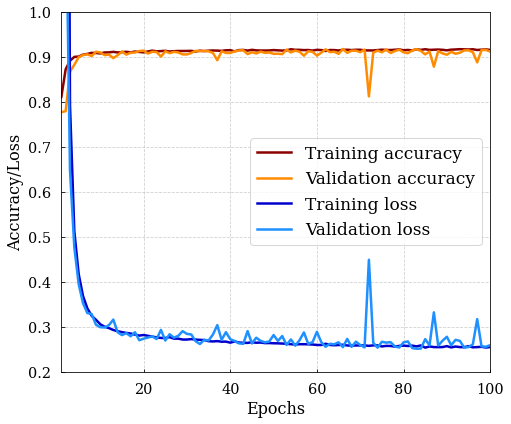

In [19]:
Epochs = np.arange(1,101,1)
history_dict = model.history.history

train_acc = history_dict['accuracy']
val_acc = history_dict['val_accuracy']
train_loss = history_dict['loss']
val_loss = history_dict['val_loss']
train_err = 1.0 - np.asarray(train_acc)
val_err = 1.0 - np.asarray(val_acc)

# =====================================================================
# =====================================================================
plt.figure(figsize=(7.2, 6.0))

# Plot Accuracy
plt.plot(Epochs, train_acc, c = 'darkred',linewidth=2.5,label='Training accuracy')
plt.plot(Epochs, val_acc , c = 'darkorange',linewidth=2.5,label='Validation accuracy')
# Plot Loss
plt.plot(Epochs, train_loss, c = 'mediumblue',linewidth=2.5,label='Training loss')
plt.plot(Epochs, val_loss , c = 'dodgerblue',linewidth=2.5,label='Validation loss')

# =====================================================================
plt.grid(ls='--',alpha=0.6)
plt.xlabel('Epochs', fontsize=16);plt.ylabel('Accuracy/Loss',fontsize=16)
plt.xlim(1,100)
plt.ylim(0.2,1)
plt.legend(frameon=True, loc='center right', fontsize=17)
plt.tick_params(axis='both', labelsize=14.5)

plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Acc_Loss.pdf")
#files.download("/content/drive/My Drive/Plots/Acc_Loss.pdf")
plt.show()

Predict on the test data and print classification metrics

In [20]:
# Predict on test data 
y_pred_DL = model.predict_classes(X_test)

# Print classification metrics 
print("Accuracy score for DL:",accuracy_score(y_test,y_pred_DL))
print("Precision score for DL:",precision_score(y_test,y_pred_DL))
print("Recall score for DL:",recall_score(y_test,y_pred_DL))
print("AUC score for DL:",roc_auc_score(y_test,y_pred_DL))#Not correct, see below 

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
Accuracy score for DL: 0.92
Precision score for DL: 0.9030803906836965
Recall score for DL: 0.9442262372348782
AUC score for DL: 0.9195458814536249


**Plot confusion matrix**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

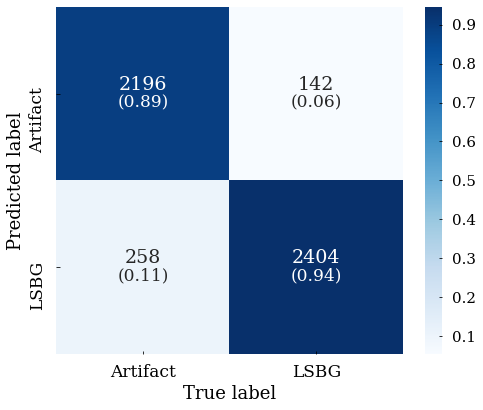

In [23]:
# Get the confusion matrix for the Deep Learning
con_mat_DL = confusion_matrix(y_test, y_pred_DL)

# Get annotations and normalized confusion matrix
a = con_mat_DL[0]/np.sum(con_mat_DL[0])
b = con_mat_DL[1]/np.sum(con_mat_DL[1])


con_mat_normalized = np.zeros([2,2])
con_mat_normalized[0] = a
con_mat_normalized[1] = b

# Annotations
an_1 = "("+"{:.2f}".format(a[0])+")"
an_2 = "("+"{:.2f}".format(a[1])+")"
an_3 = "("+"{:.2f}".format(b[0])+")"
an_4 = "("+"{:.2f}".format(b[1])+")"

annots = np.zeros([2,2],dtype='U6')

annots[0,0] = an_1;annots[0,1] = an_2
annots[1,0] = an_3;annots[1,1] = an_4

class_names = ['Artifact','LSBG']
# ==============================================
# ==============================================


plt.figure(figsize = (7,6.0))
g =sns.heatmap(con_mat_DL.T, square = True, annot=True,annot_kws={'va':'bottom',"size": 19},fmt='.0f', cmap='Blues', cbar=False, 
           xticklabels= class_names,
           yticklabels= class_names)
sns.heatmap(con_mat_normalized.T, square=True, annot=annots.T, annot_kws={'va':'top',"size": 17},cmap='Blues',fmt='', cbar=True,
            cbar_kws={'shrink':0.94})
g.set_xticklabels(class_names, fontsize = 17)
g.set_yticklabels(class_names, fontsize = 17)

# Ticks for colorbar
cax = plt.gcf().axes[-1]
cax.tick_params(labelsize=15)
# =========================================
# =========================================
plt.xlabel('True label',fontsize=18)
plt.ylabel('Predicted label',fontsize=18)

plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Conf_matrix_DL.pdf")
#files.download("/content/drive/My Drive/Plots/Conf_matrix_DL.pdf")
plt.show()

In [24]:
print(len(y_test[(y_test==0.0)&(y_pred_DL[:,0]==1)]))
#print(np.shape(y_pred_DL))

258


**Plot probabilities**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

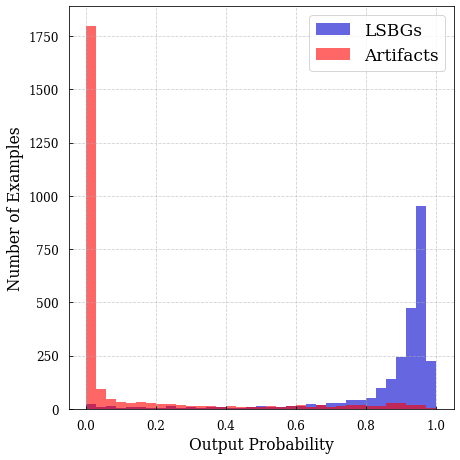

In [25]:
# First let's predict probabilities on the test set
scores_DL = model.predict(X_test)

plt.figure(figsize = (6.5,6.5))


plt.hist(scores_DL[y_test==1.0],range=[0,1],bins=35,color='mediumblue',alpha=0.6,density=False,label='LSBGs')
plt.hist(scores_DL[y_test==0.0],range=[0,1],bins=35,color='red',alpha=0.6,density=False,label='Artifacts')
# ==============================================================================
# ==============================================================================
plt.grid(ls='--',alpha=0.6)
plt.tick_params(axis='both', labelsize=12)
plt.legend(frameon=True, loc='upper right', fontsize=17)

plt.xlabel("Output Probability", fontsize=15.5)
plt.ylabel("Number of Examples", fontsize=15.5)

plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/DL_probas.pdf")
#files.download("/content/drive/My Drive/Plots/DL_probas.pdf")
plt.show()

**Misclassification Examples**

Now, let's plot some misclassification Examples.

Actually get Artefacts classified as LSBGs with probability $P>0.8$ and LSBGs classified as Artefacts (probability $P<0.2$).


In [26]:
X_misc_Art = X_test[(scores_DL[:,0]>0.8)&(y_test==0.0)] #Artefacts classified as LSBGs
X_misc_LSBG = X_test[(scores_DL[:,0]<0.2)&(y_test==1.0)] #LSBGs classified as Artefacts
# ==============================================================================
# ==============================================================================
# Get probabilities/scores 
P_misc_Art = scores_DL[(scores_DL[:,0]>0.8)&(y_test==0.0)] #Artefacts classified as LSBGs
P_misc_LSBG = scores_DL[(scores_DL[:,0]<0.2)&(y_test==1.0)] #LSBGs classified as Artefacts
# ==============================================================================
# ==============================================================================
# Print numbers of each one
print(len(P_misc_Art),len(P_misc_LSBG))

117 67


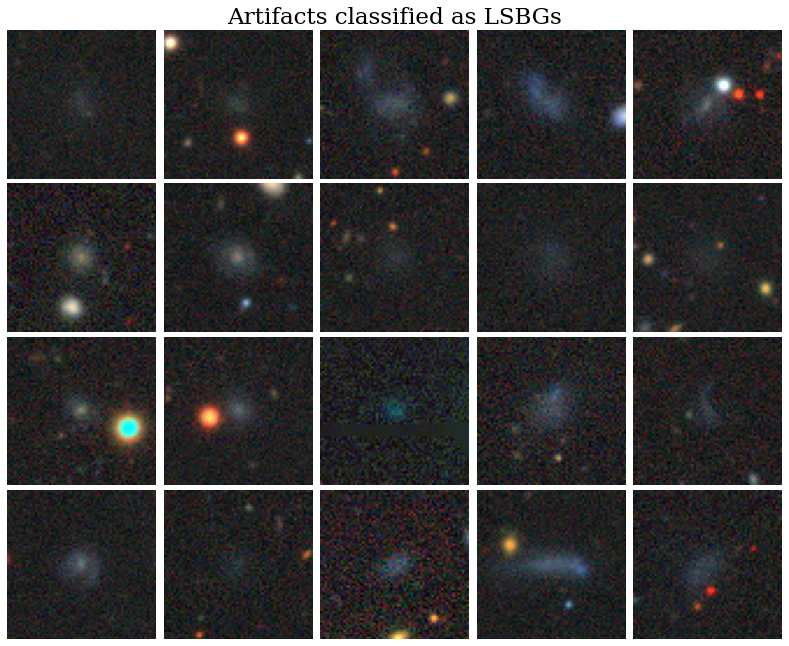

In [27]:
# Plot them
n_rows = 4
n_cols = 5

plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

for i in range(n_rows*n_cols):
    if (i==3):
        plt.title("Artifacts classified as LSBGs",fontsize=23)
    plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(X_misc_Art[i])
    plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.03)
#plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Misclass_Art_Examples.pdf")
#files.download("/content/drive/My Drive/Plots/Misclass_Art_Examples.pdf")
plt.show()


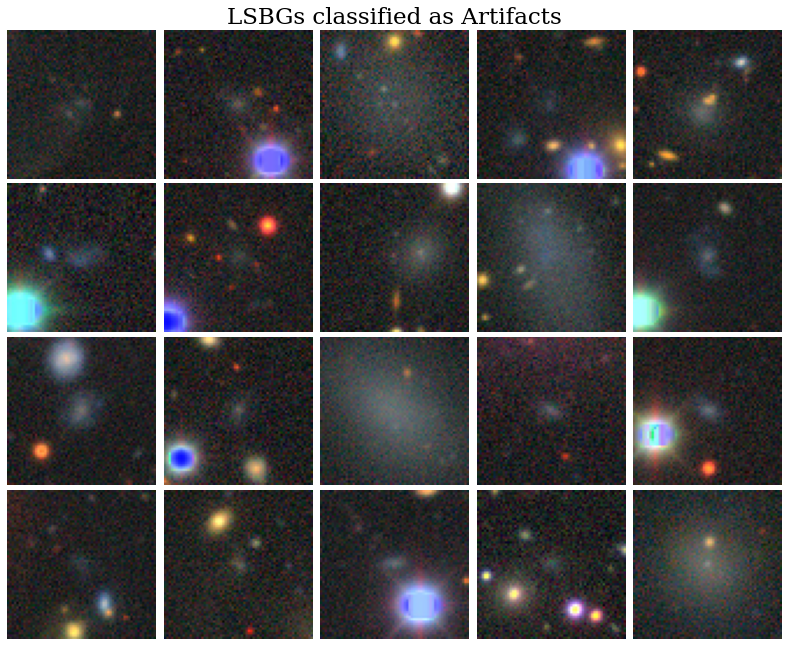

In [29]:
plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

for i in range(n_rows*n_cols):
    if (i==3):
        plt.title("LSBGs classified as Artifacts",fontsize=23)
    plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(X_misc_LSBG[i])
    plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.03)
#plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Misclass_LSBG_Examples.pdf")
#files.download("/content/drive/My Drive/Plots/Misclass_LSBG_Examples.pdf")
plt.show()

**Correct classification examples with low probability**

LSBGs with $0.5<P<0.6$.

Artefacts with $0.4 < P < 0.5$.

In [30]:
X_corr_Art = X_test[(scores_DL[:,0]>0.4)&(scores_DL[:,0]<0.5)&(y_test==0.0)] #Artifacts classified as LSBGs
X_corr_LSBG = X_test[(scores_DL[:,0]>0.5)&(scores_DL[:,0]<0.6)&(y_test==1.0)] #LSBGs classified as LSBGs
# ==============================================================================
# ==============================================================================
# Get probabilities/scores 
P_corr_Art = scores_DL[(scores_DL[:,0]>0.4)&(scores_DL[:,0]<0.5)&(y_test==0.0)] #Artifacts classified as Artefacts
P_corr_LSBG = scores_DL[(scores_DL[:,0]>0.5)&(scores_DL[:,0]<0.6)&(y_test==1.0)] #LSBGs classified as LSBGs
# ==============================================================================
# ==============================================================================
# Print numbers of each one
print(len(P_corr_Art),len(P_corr_LSBG))

35 34


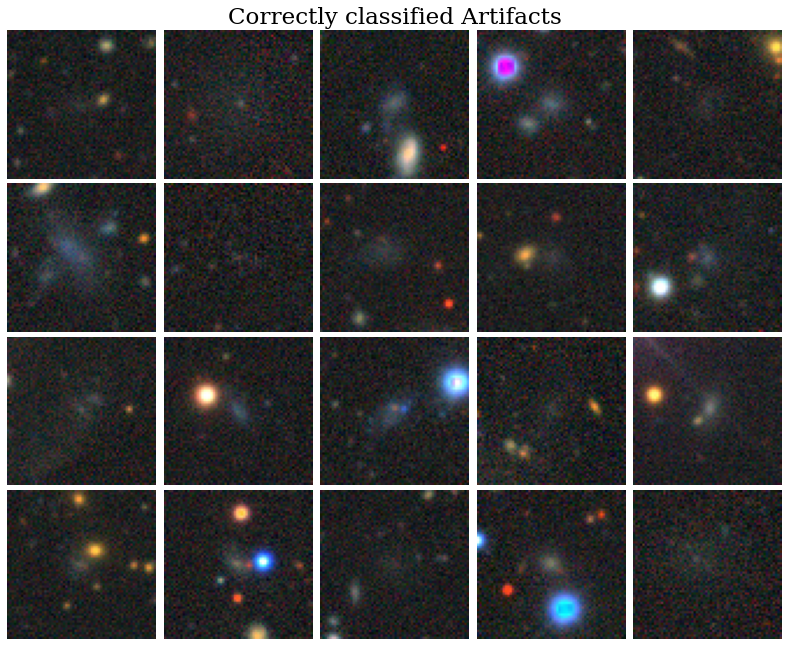

In [31]:
plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

for i in range(n_rows*n_cols):
    if (i==3):
        plt.title("Correctly classified Artifacts",fontsize=23)
    plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(X_corr_Art[i])
    plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.03)
#plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Corr_Art_Examples.pdf")
#files.download("/content/drive/My Drive/Plots/Corr_Art_Examples.pdf")
plt.show()

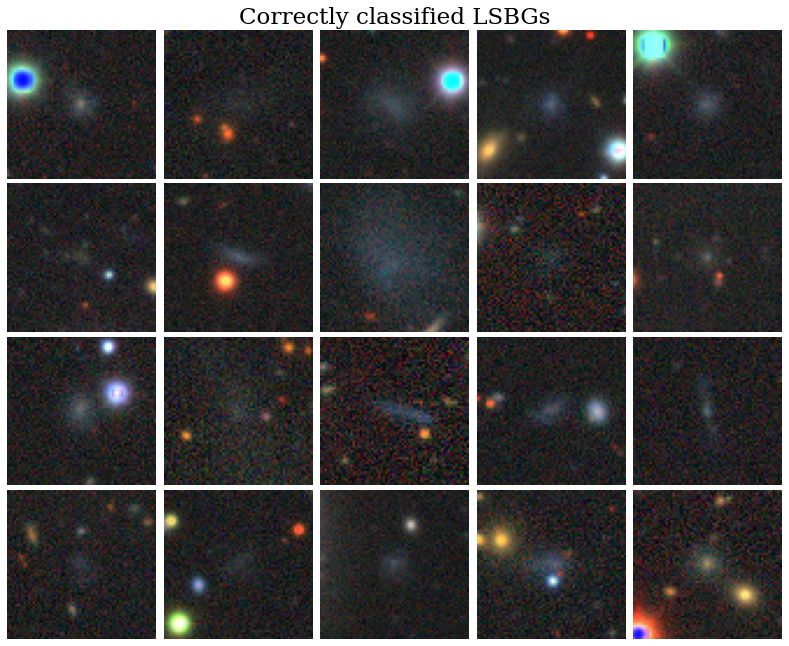

In [32]:
plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

for i in range(n_rows*n_cols):
    if (i==3):
        plt.title("Correctly classified LSBGs",fontsize=23)
    plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(X_corr_LSBG[i])
    plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.03)
#plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Corr_LSBG_Examples.pdf")
#files.download("/content/drive/My Drive/Plots/Corr_LSBG_Examples.pdf")
plt.show()

### Uncertainty estimation via bootstrap

We write a function that allows us to estimate the error in the evaluation metrics using the bootstrap method. 

It takes as inputs the class prediction and the probability prediction and outputs a sample of bootstrapped sample estimates for the classification metrics and for the true positive rates needed for the roc curve.

In [33]:
def bootstrap(y_pred, y_pred_proba,y_test_loc):
  n_bootstraps = 1000 

  # Classification metrics that we want to estimate
  # ===============================================================
  boot_accuracy = np.zeros(n_bootstraps)
  boot_precision = np.zeros(n_bootstraps) #Also known as purity
  boot_recall = np.zeros(n_bootstraps) # Also known as completeness
  boot_tprs = np.zeros((n_bootstraps,200)) # True positive rates
  boot_auc = np.zeros(n_bootstraps) # AUC
  fprs = np.linspace(0,1,200) # False positive rates
  # ===============================================================
  # ===============================================================
  indices = np.arange(len(y_test_loc))

  for i in range(n_bootstraps):
    # Get local indices by resampling
    ind_loc = resample(indices, n_samples=len(indices), replace=True)

    # ================================================================================
    # Now get "local" test samples, meaning those resulting from resampling

    y_pred_loc = y_pred[ind_loc]  #Prediction 
    y_pred_prob_loc = y_pred_proba[ind_loc] #Probability prediction
    y_true_loc = y_test_loc[ind_loc] #True labels of the test set

    # ================================================================================
    # ================================================================================
    # Now estimate the evaluation metrics for the current resampling

    boot_accuracy[i] = accuracy_score(y_true_loc, y_pred_loc) #Accuracy
    boot_precision[i] = precision_score(y_true_loc, y_pred_loc) #Precision
    boot_recall[i] = recall_score(y_true_loc, y_pred_loc) #Recall
    boot_auc[i] = roc_auc_score(y_true_loc, y_pred_prob_loc[:,0]) #AUC score 

    # And now for the true positive rate, in order to get the errors on the ROC curve

    fpr_loc, tpr_loc, thresholds_loc = roc_curve(y_true_loc, y_pred_prob_loc[:,0], pos_label=1.0)
    fpr_unique, ind_unique = np.unique(fpr_loc,return_index=True)
    tpr_unique = tpr_loc[ind_unique]

    # interpolate the false positive - true positives
    interp = interpolate.interp1d(fpr_unique, tpr_unique, kind='linear')
    boot_tprs[i,:] = interp(fprs)

  # =================================================================================
  # return them 
  return boot_accuracy,boot_precision,boot_recall,boot_auc,boot_tprs

Now, get probablity predictions for the three models (SVM, RF, DL) to be used for the bootstrap sample estimates.

In [34]:
# For SVM
probs_svm = svm_c.predict_proba(X_feat_test_stand)
# For Random Forests 
probs_RF = RF_cl.predict_proba(X_feat_test_stand)
# For Deep Learning - Deep Shadows 
scores_DL = model.predict(X_test)

Get bootstrapped samples now

In [35]:
# For SVM
acc_boot_svm, prec_boot_svm, rec_boot_svm, auc_boot_svm, tprs_boot_svm = bootstrap(y_pred_svm, probs_svm, y_test)
# For Random Forests 
acc_boot_RF, prec_boot_RF, rec_boot_RF, auc_boot_RF, tprs_boot_RF = bootstrap(y_pred_RF, probs_RF, y_test)
# For Deep Learning - Deep Shadows
acc_boot_DL, prec_boot_DL, rec_boot_DL, auc_boot_DL, tprs_boot_DL = bootstrap(y_pred_DL, scores_DL, y_test)

**Estimate $95\%$ intervals**

- For the SVM 

In [36]:
# Accuracy

acc_boot_svm.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_acc_svm = acc_boot_svm[int(0.025 * len(acc_boot_svm))]
conf_upper_acc_svm = acc_boot_svm[int(0.975 * len(acc_boot_svm))]
# Print confidence interval
print("Accuracy confidence intervals, SVM:",conf_lower_acc_svm,conf_upper_acc_svm)
# ==============================================================================
# ==============================================================================
# Precision

# sort
prec_boot_svm.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_prec_svm = prec_boot_svm[int(0.025 * len(prec_boot_svm))]
conf_upper_prec_svm = prec_boot_svm[int(0.975 * len(prec_boot_svm))]
# Print confidence interval
print("Precision confidence intervals, SVM:",conf_lower_prec_svm,conf_upper_prec_svm)
# ==============================================================================
# ==============================================================================
# Recall

# sort
rec_boot_svm.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_rec_svm = rec_boot_svm[int(0.025 * len(rec_boot_svm))]
conf_upper_rec_svm = rec_boot_svm[int(0.975 * len(rec_boot_svm))]
# Print confidence interval
print("Recall confidence intervals, SVM:",conf_lower_rec_svm,conf_upper_rec_svm)
# ==============================================================================
# ==============================================================================
# AUC score

# sort
auc_boot_svm.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_auc_svm = auc_boot_svm[int(0.025 * len(auc_boot_svm))]
conf_upper_auc_svm = auc_boot_svm[int(0.975 * len(auc_boot_svm))]
# Print confidence interval
print("AUC confidence intervals, SVM:",conf_lower_auc_svm,conf_upper_auc_svm)

Accuracy confidence intervals, SVM: 0.8094 0.83
Precision confidence intervals, SVM: 0.7817531305903399 0.8118377785896967
Recall confidence intervals, SVM: 0.8550156739811913 0.8800465838509317
AUC confidence intervals, SVM: 0.09764496164842597 0.11531765228824181


- For the Random Forest Model

In [37]:
# Accuracy

acc_boot_RF.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_acc_RF = acc_boot_RF[int(0.025 * len(acc_boot_RF))]
conf_upper_acc_RF = acc_boot_RF[int(0.975 * len(acc_boot_RF))]
# Print confidence interval
print("Accuracy confidence intervals, RF:",conf_lower_acc_RF,conf_upper_acc_RF)
# ==============================================================================
# ==============================================================================
# Precision

# sort
prec_boot_RF.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_prec_RF = prec_boot_RF[int(0.025 * len(prec_boot_RF))]
conf_upper_prec_RF = prec_boot_RF[int(0.975 * len(prec_boot_RF))]
# Print confidence interval
print("Precision confidence intervals, RF:",conf_lower_prec_RF,conf_upper_prec_RF)
# ==============================================================================
# ==============================================================================
# Recall

# sort
rec_boot_RF.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_rec_RF = rec_boot_RF[int(0.025 * len(rec_boot_RF))]
conf_upper_rec_RF = rec_boot_RF[int(0.975 * len(rec_boot_RF))]
# Print confidence interval
print("Recall confidence intervals, RF:",conf_lower_rec_RF,conf_upper_rec_RF)
# ==============================================================================
# ==============================================================================
# AUC score

# sort
auc_boot_RF.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_auc_RF = auc_boot_RF[int(0.025 * len(auc_boot_RF))]
conf_upper_auc_RF = auc_boot_RF[int(0.975 * len(auc_boot_RF))]
# Print confidence interval
print("AUC confidence intervals, RF:",1-conf_lower_auc_RF,1-conf_upper_auc_RF)

Accuracy confidence intervals, RF: 0.7862 0.8082
Precision confidence intervals, RF: 0.7802498048399688 0.8124276341181011
Recall confidence intervals, RF: 0.7935206869633099 0.8226977455101261
AUC confidence intervals, RF: 0.8814335568251479 0.861772889745704


- For the Deep Learning Model

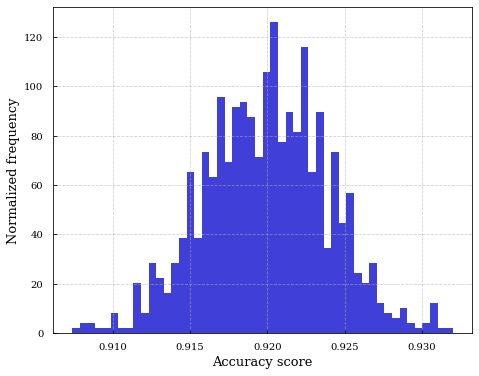

In [38]:
# For Accuracy - note, the plot is just for our inspection, we are not going to show it in the paper 
plt.figure(figsize=(7.5, 6.0))

plt.hist(acc_boot_DL, bins=50,color='mediumblue',alpha=0.75, density=True)
plt.grid(ls='--',alpha=0.6)

plt.xlabel('Accuracy score',fontsize=13);plt.ylabel('Normalized frequency',fontsize=13)
plt.show()

Using the above results show the $95\%$ interval.


In [39]:
acc_boot_DL.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_acc_DL = acc_boot_DL[int(0.025 * len(acc_boot_DL))]
conf_upper_acc_DL = acc_boot_DL[int(0.975 * len(acc_boot_DL))]
# Print confidence interval
print("Accuracy confidence intervals, DeepShadows:",conf_lower_acc_DL,conf_upper_acc_DL)

Accuracy confidence intervals, DeepShadows: 0.9122 0.9276


Now, simlarly to the above, get intervals for the other evaluation metrics

In [40]:
# Precision

# sort
prec_boot_DL.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_prec_DL = prec_boot_DL[int(0.025 * len(prec_boot_DL))]
conf_upper_prec_DL = prec_boot_DL[int(0.975 * len(prec_boot_DL))]
# Print confidence interval
print("Precision confidence intervals, DeepShadows:",conf_lower_prec_DL,conf_upper_prec_DL)
# ==============================================================================
# ==============================================================================
# Recall

# sort
rec_boot_DL.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_rec_DL = rec_boot_DL[int(0.025 * len(rec_boot_DL))]
conf_upper_rec_DL = rec_boot_DL[int(0.975 * len(rec_boot_DL))]
# Print confidence interval
print("Recall confidence intervals, DeepShadows:",conf_lower_rec_DL,conf_upper_rec_DL)
# ==============================================================================
# ==============================================================================
# AUC score

# sort
auc_boot_DL.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_auc_DL = auc_boot_DL[int(0.025 * len(auc_boot_DL))]
conf_upper_auc_DL = auc_boot_DL[int(0.975 * len(auc_boot_DL))]
# Print confidence interval
print("AUC confidence intervals, DeepShadows:",conf_lower_auc_DL,conf_upper_auc_DL)

Precision confidence intervals, DeepShadows: 0.8908620051794303 0.9141316904120138
Recall confidence intervals, DeepShadows: 0.9352713178294574 0.9531864673485445
AUC confidence intervals, DeepShadows: 0.9695872936212052 0.9774465157967718


### ROC curves for the three models (SVM, RF, DL)

In [41]:
# Get false positive rates and true positive rates for the three models

# For SVM 
fpr_svm, tpr_svm, thresholds_svm = roc_curve(y_test, probs_svm[:,0], pos_label=1.0)
#For Random Forests
fpr_RF, tpr_RF, thresholds_RF = roc_curve(y_test, probs_RF[:,0], pos_label=1.0)
# For Deep Learning - Deep Shadows 
fpr_DL, tpr_DL, thresholds_DL = roc_curve(y_test, scores_DL[:,0], pos_label=1.0)

Estimate confidence intervals



In [42]:
fprs = np.linspace(0,1,200) # False positive rates

# For SVM
# Create empty arrays - to store the intervals
lower_tprs_svm = np.zeros(200)
upper_tprs_svm = np.zeros(200)

for i in range(200):
  tprs_boot_svm_loc = tprs_boot_svm[:,i]

  #sort it
  tprs_boot_svm_loc.sort()
  # Compute the lower and upper bound of the 95% confidence interval
  lower_tprs_svm[i] = tprs_boot_svm_loc[int(0.025 * len(tprs_boot_svm_loc))]
  upper_tprs_svm[i] = tprs_boot_svm_loc[int(0.975 * len(tprs_boot_svm_loc))]
# ==============================================================================
# ==============================================================================

# For Random Forests
# Create empty arrays - to store the intervals
lower_tprs_RF = np.zeros(200)
upper_tprs_RF = np.zeros(200)

for i in range(200):
  tprs_boot_RF_loc = tprs_boot_RF[:,i]

  #sort it
  tprs_boot_RF_loc.sort()
  # Compute the lower and upper bound of the 95% confidence interval
  lower_tprs_RF[i] = tprs_boot_RF_loc[int(0.025 * len(tprs_boot_RF_loc))]
  upper_tprs_RF[i] = tprs_boot_RF_loc[int(0.975 * len(tprs_boot_RF_loc))]
# ==============================================================================
# ==============================================================================

# For Deep Learning - Deep shadows

# Create empty arrays - to store the intervals
lower_tprs_DL = np.zeros(200)
upper_tprs_DL = np.zeros(200)

for i in range(200):
  tprs_boot_DL_loc = tprs_boot_DL[:,i]

  #sort it
  tprs_boot_DL_loc.sort()
  # Compute the lower and upper bound of the 95% confidence interval
  lower_tprs_DL[i] = tprs_boot_DL_loc[int(0.025 * len(tprs_boot_DL_loc))]
  upper_tprs_DL[i] = tprs_boot_DL_loc[int(0.975 * len(tprs_boot_DL_loc))]  

Calculate and print the AUCs for the three models



In [43]:
# AUC SVM
AUC_svm = 1.0-roc_auc_score(y_test,probs_svm[:,0])
# AUC RF
AUC_RF = 1.0-roc_auc_score(y_test,probs_RF[:,0])
# AUC DL
AUC_DL = roc_auc_score(y_test, scores_DL[:,0])
# ========================================================
print("AUC score for SMV:",AUC_svm)
print("AUC score for RF:",AUC_RF)
print("AUC score for DL:",AUC_DL)

AUC score for SMV: 0.8940286823506967
AUC score for RF: 0.8718198833397035
AUC score for DL: 0.9736948541298143


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

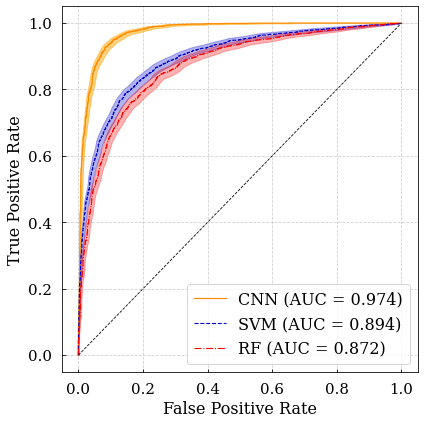

In [48]:
x = np.linspace(0,1,100)
plt.figure(figsize = (6.0,6.0))

# Deep Learning and confidence interval
plt.plot(fpr_DL,tpr_DL,c='darkorange',linewidth=1.2, label='CNN (AUC = 0.974)')
plt.fill_between(fprs,lower_tprs_DL, upper_tprs_DL,color='orange',rasterized=True,alpha=0.5)

# SVM and confidence interval
plt.plot(tpr_svm,fpr_svm,c='mediumblue',ls='--',linewidth=1.1,label='SVM (AUC = 0.894)')
plt.fill_betweenx(fprs,lower_tprs_svm,upper_tprs_svm,color='mediumblue',rasterized=True,alpha=0.3)

# Random Forest and confidence interval
plt.plot(tpr_RF,fpr_RF,c='red',linewidth=1.1,ls='-.', label='RF (AUC = 0.872)')
plt.fill_betweenx(fprs,upper_tprs_RF,lower_tprs_RF,color='red',rasterized=True,alpha=0.3)

plt.plot(x,x, c='k',ls='--',linewidth=0.8)
plt.grid(ls='--', alpha=0.6)


#plt.title('ROC curve')
plt.xlabel('False Positive Rate',fontsize=16);plt.ylabel('True Positive Rate',fontsize=16)
plt.legend(frameon=True, loc='lower right', fontsize=16)
plt.tick_params(axis='both', labelsize=15)

plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/ROC_curves.pdf")
#files.download("/content/drive/My Drive/Plots/ROC_curves.pdf")
plt.show()

## Part III: Transfer Learning



- Start by importing the HSC dataset - training and test

In [49]:
X_tr_HSC = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/X_train_HSC.npy")) #Training data
X_test_HSC = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/X_test_HSC.npy")) #Test data
# ======================================================================================
# ======================================================================================
y_tr_HSC = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/y_train_HSC.npy")) #Training labels
y_test_HSC = np.float64(np.load("/content/drive/My Drive/Galaxies_Data/y_test_HSC.npy")) #Test labels

In [50]:
print(len(y_test_HSC))

960


### Part IIIa) Predict on the test set without fine-tuning

In [51]:
# Predict classes on the test set
y_pred_HSC = model.predict_classes(X_test_HSC)
# Predict probabilities
y_pred_proba_HSC = model.predict(X_test_HSC)

Now evaluate the performance using the common metrics

In [53]:
# Print classification metrics 
print("Accuracy score for HSC, before fine-tuning:",accuracy_score(y_test_HSC,y_pred_HSC))
print("Precision score for HSC, before fine-tuning:",precision_score(y_test_HSC,y_pred_HSC))
print("Recall score for HSC, before fine-tuning:",recall_score(y_test_HSC,y_pred_HSC))
print("AUC score for HSC, before fine-tuning:",roc_auc_score(y_test_HSC,y_pred_proba_HSC[:,0]))

Accuracy score for HSC, before fine-tuning: 0.8208333333333333
Precision score for HSC, before fine-tuning: 0.8492239467849224
Recall score for HSC, before fine-tuning: 0.7864476386036962
AUC score for HSC, before fine-tuning: 0.9020581634114894


Get true and false positive rates, for the ROC curve.

In [54]:
fpr_HSC_before, tpr_HSC_before, thresholds_HSC_before = roc_curve(y_test_HSC, y_pred_proba_HSC[:,0], pos_label=1.0)

Plot the confusion matrix as well.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

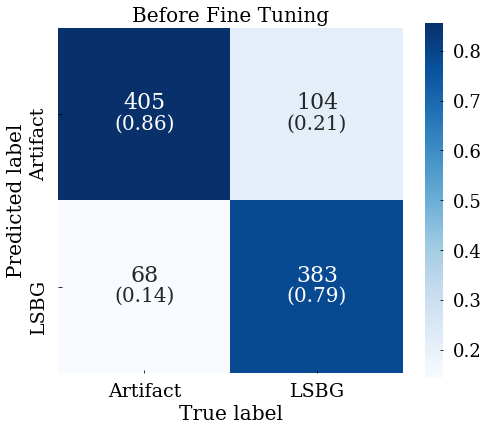

In [55]:
# Get the confusion matrix for the HSC, before fine-tuning
con_mat_HSC_before = confusion_matrix(y_test_HSC, y_pred_HSC)

# Get annotations and normalized confusion matrix
a_before = con_mat_HSC_before[0]/np.sum(con_mat_HSC_before[0])
b_before = con_mat_HSC_before[1]/np.sum(con_mat_HSC_before[1])


con_mat_norm_before = np.zeros([2,2])
con_mat_norm_before[0] = a_before
con_mat_norm_before[1] = b_before

# Annotations
an_1_bef = "("+"{:.2f}".format(a_before[0])+")"
an_2_bef = "("+"{:.2f}".format(a_before[1])+")"
an_3_bef = "("+"{:.2f}".format(b_before[0])+")"
an_4_bef = "("+"{:.2f}".format(b_before[1])+")"

annots_before = np.zeros([2,2],dtype='U6')

annots_before[0,0] = an_1_bef;annots_before[0,1] = an_2_bef
annots_before[1,0] = an_3_bef;annots_before[1,1] = an_4_bef


class_names = ['Artifact','LSBG']
# ===========================================================
# ===========================================================

plt.figure(figsize = (7,6.2))
g = sns.heatmap(con_mat_HSC_before.T, square = True, annot=True,annot_kws={'va':'bottom',"size": 22},fmt='.0f', cmap='Blues', cbar=False, 
           xticklabels= class_names,
           yticklabels= class_names)
sns.heatmap(con_mat_norm_before.T, square=True, annot=annots_before.T, annot_kws={'va':'top',"size": 20},cmap='Blues',fmt='', cbar=True,
            cbar_kws={'shrink':0.94})
g.set_xticklabels(class_names, fontsize = 19)
g.set_yticklabels(class_names, fontsize = 19)

# Ticks for colorbar
cax = plt.gcf().axes[-1]
cax.tick_params(labelsize=18)
# =========================================
# =========================================
plt.title('Before Fine Tuning',fontsize=20)
plt.xlabel('True label',fontsize=20)
plt.ylabel('Predicted label',fontsize=20)

plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Conf_matrix_HSC_before.pdf")
files.download("/content/drive/My Drive/Plots/Conf_matrix_HSC_before.pdf")
plt.show()

Get confidence intervals for the classification metrics:

In [57]:
# Get bootstraped samples for predictions on HSC, before fine tuning
acc_boot_HSC_bef, prec_boot_HSC_bef, rec_boot_HSC_bef, auc_boot_HSC_bef, tprs_boot_HSC_bef = bootstrap(y_pred_HSC, y_pred_proba_HSC, y_test_HSC)

Calculate confidence intervals

In [75]:
# Accuracy

acc_boot_HSC_bef.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_acc_HSC_bef = acc_boot_HSC_bef[int(0.025 * len(acc_boot_HSC_bef))]
conf_upper_acc_HSC_bef = acc_boot_HSC_bef[int(0.975 * len(acc_boot_HSC_bef))]
# Print confidence interval
print("Accuracy confidence intervals, HSC, before fine-tuning:",conf_lower_acc_HSC_bef,conf_upper_acc_HSC_bef)
# ==============================================================================
# ==============================================================================

# Precision

# sort
prec_boot_HSC_bef.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_prec_HSC_bef = prec_boot_HSC_bef[int(0.025 * len(prec_boot_HSC_bef))]
conf_upper_prec_HSC_bef = prec_boot_HSC_bef[int(0.975 * len(prec_boot_HSC_bef))]
# Print confidence interval
print("Precision confidence intervals, HSC, before fine-tuning:",conf_lower_prec_HSC_bef,conf_upper_prec_HSC_bef)
# ==============================================================================
# ==============================================================================
# Recall

# sort
rec_boot_HSC_bef.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_rec_HSC_bef = rec_boot_HSC_bef[int(0.025 * len(rec_boot_HSC_bef))]
conf_upper_rec_HSC_bef = rec_boot_HSC_bef[int(0.975 * len(rec_boot_HSC_bef))]
# Print confidence interval
print("Recall confidence intervals, HSC, before fine-tuning:",conf_lower_rec_HSC_bef,conf_upper_rec_HSC_bef)
# ==============================================================================
# ==============================================================================
# AUC score

# sort
auc_boot_HSC_bef.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_auc_HSC_bef = auc_boot_HSC_bef[int(0.025 * len(auc_boot_HSC_bef))]
conf_upper_auc_HSC_bef = auc_boot_HSC_bef[int(0.975 * len(auc_boot_HSC_bef))]
# Print confidence interval
print("AUC confidence intervals, HSC, before fine-tuning:",conf_lower_auc_HSC_bef,conf_upper_auc_HSC_bef)

Accuracy confidence intervals, HSC, before fine-tuning: 0.796875 0.8447916666666667
Precision confidence intervals, HSC, before fine-tuning: 0.8177676537585421 0.8811659192825112
Recall confidence intervals, HSC, before fine-tuning: 0.7489795918367347 0.8236514522821576
AUC confidence intervals, HSC, before fine-tuning: 0.8824514619068956 0.9227861232036597


### Part IIIb) Fine tuning

In [59]:
# Compile again the model, now with a much smaller learning rate
model.compile(optimizer=optimizers.Adadelta(0.005),
              loss= 'binary_crossentropy',
              metrics=['accuracy'])
# =======================================================================
# =======================================================================
# Now train/fit
model.fit(x=X_tr_HSC, y=y_tr_HSC,
          epochs=30, batch_size=16,
          shuffle=True)

Epoch 1/30
20/20 [==============================] - 0s 4ms/step - loss: 0.5638 - accuracy: 0.7688
Epoch 2/30
20/20 [==============================] - 0s 4ms/step - loss: 0.5099 - accuracy: 0.7969
Epoch 3/30
20/20 [==============================] - 0s 4ms/step - loss: 0.4885 - accuracy: 0.8250
Epoch 4/30
20/20 [==============================] - 0s 4ms/step - loss: 0.4427 - accuracy: 0.8375
Epoch 5/30
20/20 [==============================] - 0s 4ms/step - loss: 0.4539 - accuracy: 0.8375
Epoch 6/30
20/20 [==============================] - 0s 4ms/step - loss: 0.4406 - accuracy: 0.8156
Epoch 7/30
20/20 [==============================] - 0s 4ms/step - loss: 0.4178 - accuracy: 0.8344
Epoch 8/30
20/20 [==============================] - 0s 4ms/step - loss: 0.4243 - accuracy: 0.8313
Epoch 9/30
20/20 [==============================] - 0s 4ms/step - loss: 0.4260 - accuracy: 0.8438
Epoch 10/30
20/20 [==============================] - 0s 4ms/step - loss: 0.4022 - accuracy: 0.8406
Epoch 11/30
20/20 [

In [60]:
# Predict classes on the test set
y_pred_HSC_after = model.predict_classes(X_test_HSC)
# Predict probabilities
y_pred_proba_HSC_after = model.predict(X_test_HSC)

In [61]:
# Print classification metrics 
print("Accuracy score for HSC, after fine-tuning:",accuracy_score(y_test_HSC,y_pred_HSC_after))
print("Precision score for HSC, after fine-tuning:",precision_score(y_test_HSC,y_pred_HSC_after))
print("Recall score for HSC, after fine-tuning:",recall_score(y_test_HSC,y_pred_HSC_after))
print("AUC score for HSC, after fine-tuning:",roc_auc_score(y_test_HSC,y_pred_proba_HSC_after[:,0]))

Accuracy score for HSC, after fine-tuning: 0.8760416666666667
Precision score for HSC, after fine-tuning: 0.8407407407407408
Recall score for HSC, after fine-tuning: 0.9322381930184805
AUC score for HSC, after fine-tuning: 0.9363145807919219


In [62]:
fpr_HSC_after, tpr_HSC_after, thresholds_HSC_after = roc_curve(y_test_HSC, y_pred_proba_HSC_after[:,0], pos_label=1.0)

Get confidence intervals, after fine tuning

In [63]:
# Get bootstraped samples for predictions on HSC, after fine tuning
acc_boot_HSC_aft, prec_boot_HSC_aft, rec_boot_HSC_aft, auc_boot_HSC_aft, tprs_boot_HSC_aft = bootstrap(y_pred_HSC_after, y_pred_proba_HSC_after, y_test_HSC)

Calculate confidence intervals now

In [76]:
# Accuracy

acc_boot_HSC_aft.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_acc_HSC_aft = acc_boot_HSC_aft[int(0.025 * len(acc_boot_HSC_aft))]
conf_upper_acc_HSC_aft = acc_boot_HSC_aft[int(0.975 * len(acc_boot_HSC_aft))]
# Print confidence interval
print("Accuracy confidence intervals, HSC, after fine-tuning:",conf_lower_acc_HSC_aft,conf_upper_acc_HSC_aft)
# ==============================================================================
# ==============================================================================

# Precision

# sort
prec_boot_HSC_aft.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_prec_HSC_aft = prec_boot_HSC_aft[int(0.025 * len(prec_boot_HSC_aft))]
conf_upper_prec_HSC_aft = prec_boot_HSC_aft[int(0.975 * len(prec_boot_HSC_aft))]
# Print confidence interval
print("Precision confidence intervals, HSC, after fine-tuning:",conf_lower_prec_HSC_aft,conf_upper_prec_HSC_aft)
# ==============================================================================
# ==============================================================================
# Recall

# sort
rec_boot_HSC_aft.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_rec_HSC_aft = rec_boot_HSC_aft[int(0.025 * len(rec_boot_HSC_aft))]
conf_upper_rec_HSC_aft = rec_boot_HSC_aft[int(0.975 * len(rec_boot_HSC_aft))]
# Print confidence interval
print("Recall confidence intervals, HSC, after fine-tuning:",conf_lower_rec_HSC_aft,conf_upper_rec_HSC_aft)
# ==============================================================================
# ==============================================================================
# AUC score

# sort
auc_boot_HSC_aft.sort()
# Computing the lower and upper bound of the 95% confidence interval
conf_lower_auc_HSC_aft = auc_boot_HSC_aft[int(0.025 * len(auc_boot_HSC_aft))]
conf_upper_auc_HSC_aft = auc_boot_HSC_aft[int(0.975 * len(auc_boot_HSC_aft))]
# Print confidence interval
print("AUC confidence intervals, HSC, after fine-tuning:",conf_lower_auc_HSC_aft,conf_upper_auc_HSC_aft)

Accuracy confidence intervals, HSC, after fine-tuning: 0.85625 0.8958333333333334
Precision confidence intervals, HSC, after fine-tuning: 0.8087719298245614 0.8710865561694291
Recall confidence intervals, HSC, after fine-tuning: 0.9103869653767821 0.9541666666666667
AUC confidence intervals, HSC, after fine-tuning: 0.9214362909561239 0.9511701707394369


**ROC curves**

In [65]:
fprs = np.linspace(0,1,200) # False positive rates

# For HSC, before fine tuning
# Create empty arrays - to store the intervals
lower_tprs_bef = np.zeros(200)
upper_tprs_bef = np.zeros(200)

for i in range(200):
  tprs_boot_bef_loc = tprs_boot_HSC_bef[:,i]

  #sort it
  tprs_boot_bef_loc.sort()
  # Compute the lower and upper bound of the 95% confidence interval
  lower_tprs_bef[i] = tprs_boot_bef_loc[int(0.025 * len(tprs_boot_bef_loc))]
  upper_tprs_bef[i] = tprs_boot_bef_loc[int(0.975 * len(tprs_boot_bef_loc))]
# ==============================================================================
# ==============================================================================

# For HSC, after fine tuning
# Create empty arrays - to store the intervals
lower_tprs_aft = np.zeros(200)
upper_tprs_aft = np.zeros(200)

for i in range(200):
  tprs_boot_aft_loc = tprs_boot_HSC_aft[:,i]

  #sort it
  tprs_boot_aft_loc.sort()
  # Compute the lower and upper bound of the 95% confidence interval
  lower_tprs_aft[i] = tprs_boot_aft_loc[int(0.025 * len(tprs_boot_aft_loc))]
  upper_tprs_aft[i] = tprs_boot_aft_loc[int(0.975 * len(tprs_boot_aft_loc))]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

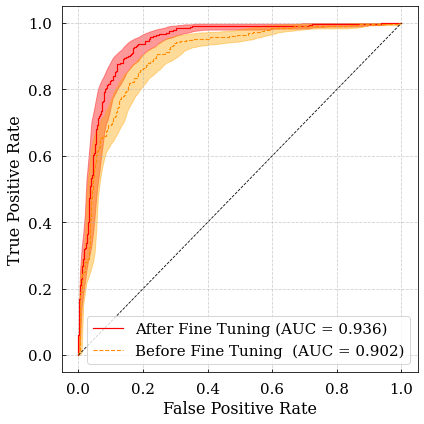

In [68]:
x = np.linspace(0,1,100)
plt.figure(figsize = (6.0,6.0))


# HSC, after fine tuning
plt.plot(fpr_HSC_after,tpr_HSC_after,c='red',linewidth=1.2, label='After Fine Tuning (AUC = 0.936)')
plt.fill_between(fprs,lower_tprs_aft, upper_tprs_aft,color='red',rasterized=True,alpha=0.4)

# HSC, before fine tuning
plt.plot(fpr_HSC_before,tpr_HSC_before,c='darkorange',ls='--',linewidth=1.1, label='Before Fine Tuning  (AUC = 0.902)')
plt.fill_between(fprs,lower_tprs_bef, upper_tprs_bef,color='orange',rasterized=True,alpha=0.4)


plt.plot(x,x, c='k',ls='--',linewidth=0.8)
plt.grid(ls='--', alpha=0.6)


#plt.title('ROC curve')
plt.xlabel('False Positive Rate',fontsize=16);plt.ylabel('True Positive Rate',fontsize=16)
plt.legend(frameon=True, loc='lower right', fontsize=15)
plt.tick_params(axis='both', labelsize=15)

plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/ROC_curves_HSC.pdf")
#files.download("/content/drive/My Drive/Plots/ROC_curves_HSC.pdf")
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

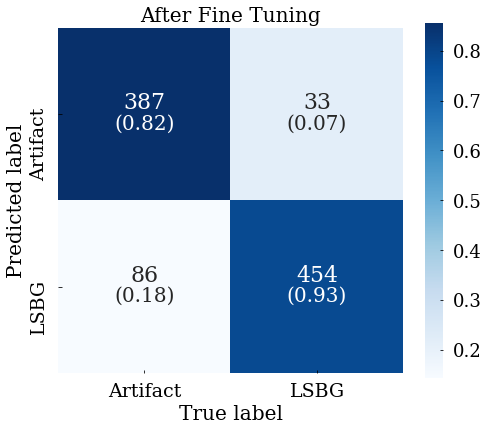

In [69]:
# Get the confusion matrix for the Deep Learning
con_mat_HSC_after = confusion_matrix(y_test_HSC, y_pred_HSC_after)


# Get annotations and normalized confusion matrix
a_after = con_mat_HSC_after[0]/np.sum(con_mat_HSC_after[0])
b_after = con_mat_HSC_after[1]/np.sum(con_mat_HSC_after[1])


con_mat_norm_after = np.zeros([2,2])
con_mat_norm_after[0] = a_after
con_mat_norm_after[1] = b_after

# Annotations
an_1_aft = "("+"{:.2f}".format(a_after[0])+")"
an_2_aft = "("+"{:.2f}".format(a_after[1])+")"
an_3_aft = "("+"{:.2f}".format(b_after[0])+")"
an_4_aft = "("+"{:.2f}".format(b_after[1])+")"

annots_after = np.zeros([2,2],dtype='U6')

annots_after[0,0] = an_1_aft;annots_after[0,1] = an_2_aft
annots_after[1,0] = an_3_aft;annots_after[1,1] = an_4_aft


plt.figure(figsize = (7.0,6.2))
g = sns.heatmap(con_mat_HSC_after.T, square = True, annot=True,annot_kws={'va':'bottom',"size": 22},fmt='.0f', cmap='Blues', cbar=False, 
           xticklabels= class_names,
           yticklabels= class_names)
sns.heatmap(con_mat_norm_before.T, square=True, annot=annots_after.T, annot_kws={'va':'top',"size": 20},cmap='Blues',fmt='', cbar=True,
            cbar_kws={'shrink':0.94})
g.set_xticklabels(class_names, fontsize = 19)
g.set_yticklabels(class_names, fontsize = 19)

# Ticks for colorbar
cax = plt.gcf().axes[-1]
cax.tick_params(labelsize=18)

plt.title('After Fine Tuning',fontsize=20)
plt.xlabel('True label',fontsize=20)
plt.ylabel('Predicted label',fontsize=20)

plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Conf_matrix_HSC_after.pdf")
#files.download("/content/drive/My Drive/Plots/Conf_matrix_HSC_after.pdf")
plt.show()

**Examples of mis-classification**

In [70]:
X_misc_HSC_Art = X_test_HSC[(y_pred_proba_HSC_after[:,0]>0.5)&(y_test_HSC==0.0)] #Artifacts classified as LSBGs
X_misc_HSC_LSBG = X_test_HSC[(y_pred_proba_HSC_after[:,0]<0.5)&(y_test_HSC==1.0)] #LSBGs classified as Artifacts
# ==============================================================================
# ==============================================================================
# Get probabilities/scores 
P_misc_HSC_Art = y_pred_proba_HSC_after[(y_pred_proba_HSC_after[:,0]>0.5)&(y_test_HSC==0.0)] #Artifacts classified as LSBGs
P_misc_HSC_LSBG = y_pred_proba_HSC_after[(y_pred_proba_HSC_after[:,0]<0.5)&(y_test_HSC==1.0)] #LSBGs classified as Artifacts
# ==============================================================================
# ==============================================================================
# Print numbers of each one
print(len(P_misc_HSC_Art),len(P_misc_HSC_LSBG))

86 33


Let's plot them



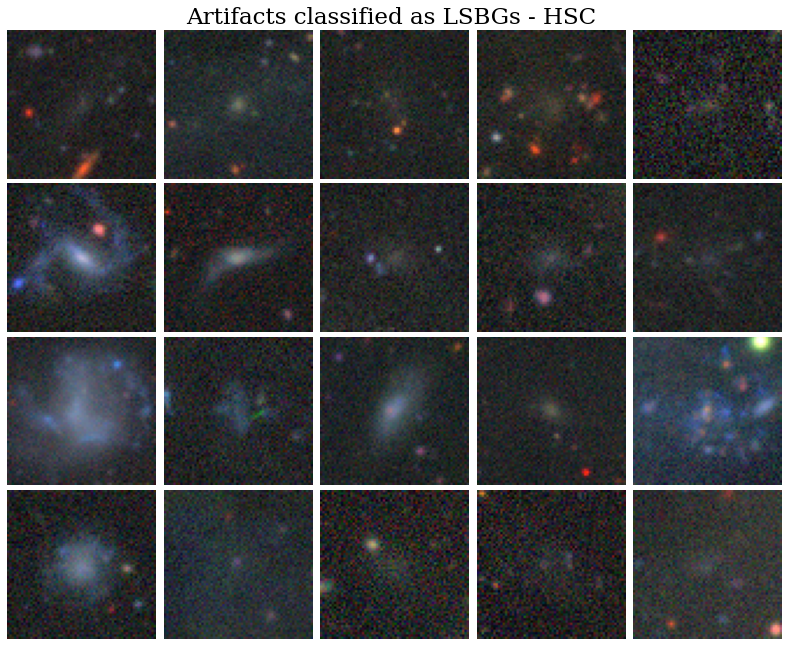

In [73]:
# Plot them
n_rows = 4
n_cols = 5

plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

for i in range(n_rows*n_cols):
    if (i==3):
        plt.title("Artifacts classified as LSBGs - HSC ",fontsize=23)
    plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(X_misc_HSC_Art[i])
    plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.03)
#plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Misclass_Art_Examples_HSC.pdf")
#files.download("/content/drive/My Drive/Plots/Misclass_Art_Examples_HSC.pdf")
plt.show()


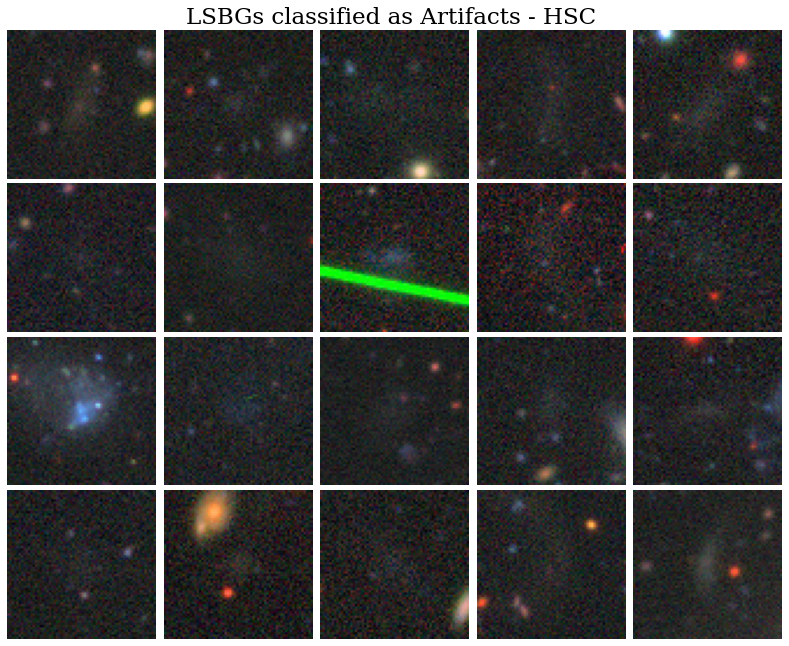

In [74]:
plt.figure(figsize=(4*n_cols*0.7, 4*n_rows*0.7))

for i in range(n_rows*n_cols):
    if (i==3):
        plt.title("LSBGs classified as Artifacts - HSC ",fontsize=23)
    plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(X_misc_HSC_LSBG[i])
    plt.axis('off')

plt.subplots_adjust(wspace=0.01, hspace=0.03)
#plt.tight_layout()
plt.savefig("/content/drive/My Drive/Plots/Misclass_LSBG_Examples_HSC.pdf")
#files.download("/content/drive/My Drive/Plots/Misclass_LSBG_Examples_HSC.pdf")
plt.show()
